In [3]:
import cv2
import math
import csv
import os
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image, ImageDraw, ImageFont
from ultralytics.solutions.solutions import BaseSolution
from ultralytics.utils.plotting import Annotator, colors
from datetime import datetime
%matplotlib inline

/home/iabd/anaconda3/envs/entorno/lib/python3.9/site-packages/torch/utils/_pytree.py:185: FutureWarning: optree is installed but the version is too old to support PyTorch Dynamo in C++ pytree. C++ pytree support is disabled. Please consider upgrading optree using `python3 -m pip install --upgrade 'optree>=0.13.0'`.
  warnings.warn(


https://www.digitalocean.com/community/tutorials/what-is-new-with-yolo

## EJERCICIO 1 
Vamos a usar el modleo YOLOv11 para detectar objetos en una imagen (en este caso vamos a aplicar el modelo directamente sin entrenarlo).
Vamos a aplicarlo en las imagenes deteccion_objetos.jpg y bus.jpg

Partiendo de la imagen deteccion_objetos.jpg y bus.jpg.



100%|██████████| 5.35M/5.35M [00:00<00:00, 25.0MB/s]



0: 640x640 11 persons, 7 bicycles, 4 cars, 2 fire hydrants, 17.1ms
1: 640x640 4 persons, 1 bus, 17.1ms
Speed: 3.4ms preprocess, 17.1ms inference, 38.6ms postprocess per image at shape (1, 3, 640, 640)


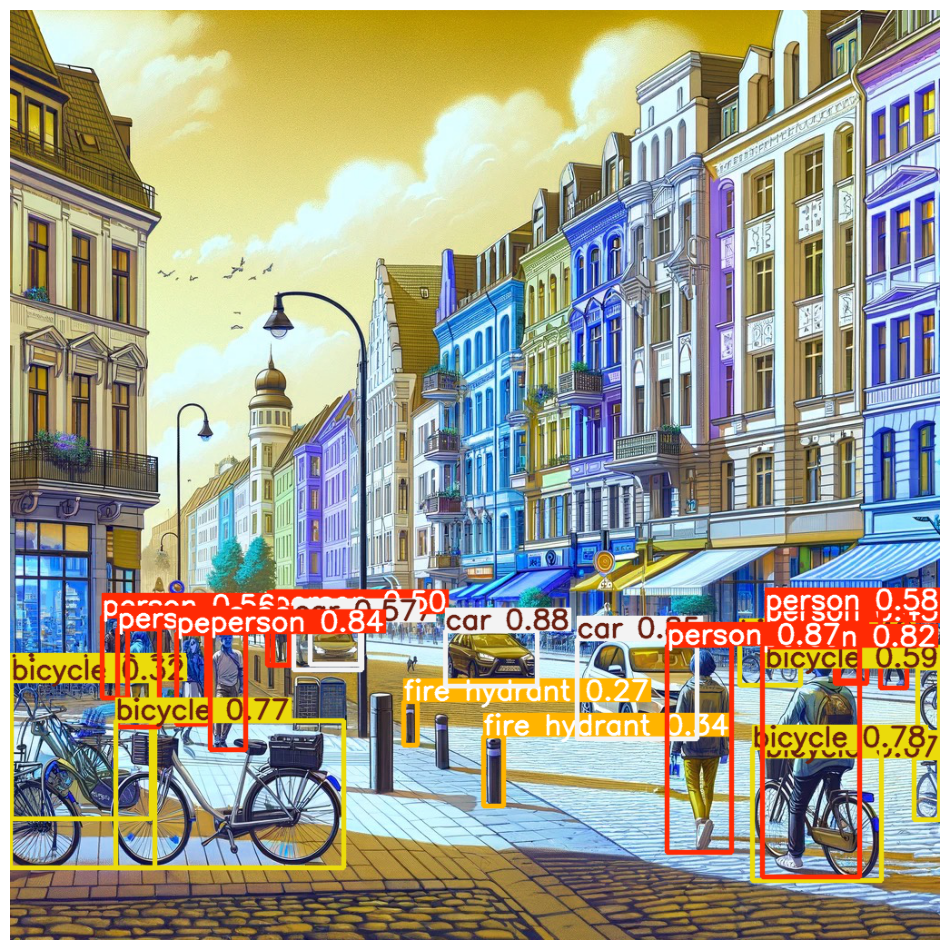

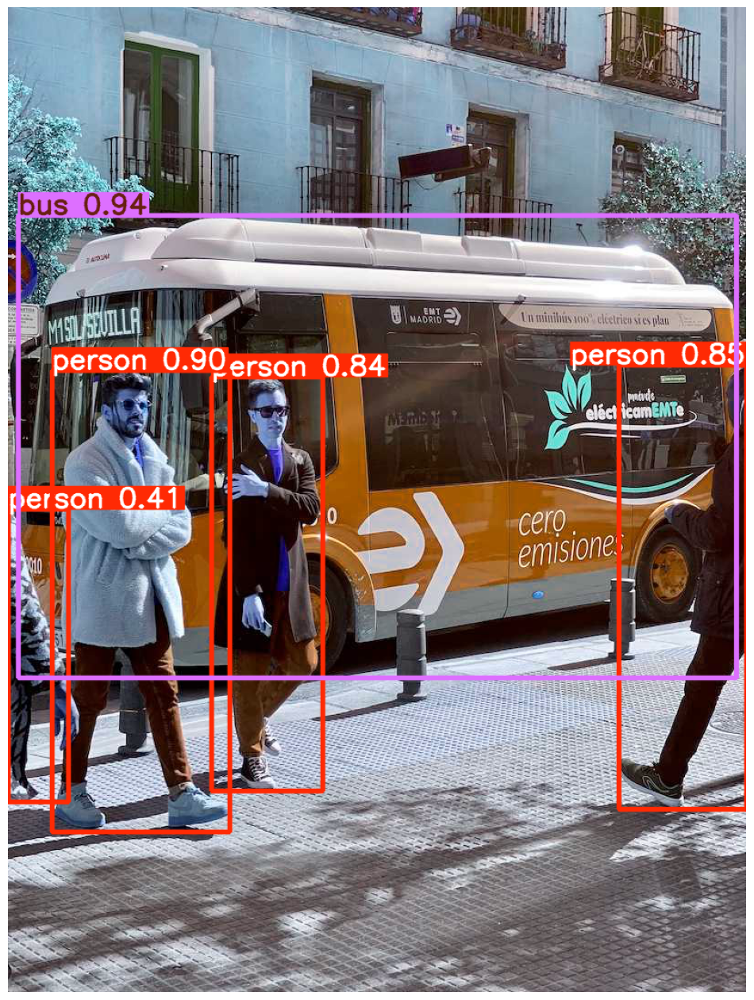

In [5]:
model = YOLO("Resultados/yolo11n.pt")

image_paths = ["datos/deteccion_objetos.jpg", "datos/bus.jpg"]
results = model(image_paths)

for i,result in enumerate(results):
    image_with_boxes = results[i].plot()
    plt.figure(figsize=(12, 20)) 
    plt.imshow(image_with_boxes)
    plt.axis("off")
    plt.show()

## EJERCICIO 2
Vamos a repetir el ejercicio pero ahora vamos a modificar la salida para que quede de la siguiente forma:

![Imagen con la el resultado que se quiere obtener 1](datos/deteccion_objetos_solucion.png)

![Imagen con la el resultado que se quiere obtener 1](datos/bus_solucion.png)

Además sólo quiero que detecte los objetos cuya probabilidad sea mayor al 50%.

Ten en cuenta que al aplicar el modelo a una imagen devuelve diferentes datos:
 * Cajas:
    * Clase (cls)
    * Probabilidad (score)
    * Coordenadas de la caja xyxy

Para representar la imagen y añadir rectángulos, texto... puedes usar Image, ImageDraw, ImageFont de PIL. Dibujas la imagen con .Draw de (ImageDraw) con .rectangle y .text puedes ir añadiendo texto y rectángulos.

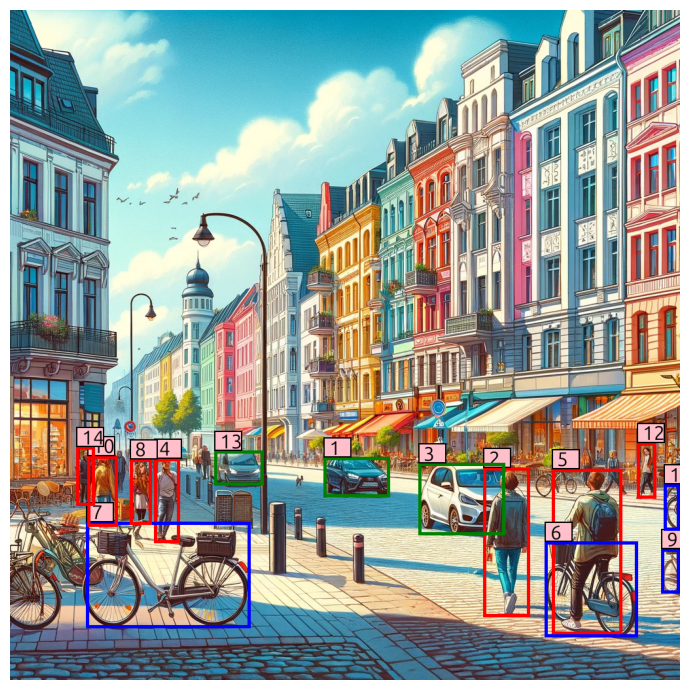

Recuadro 1: Clase=car, Score=0.88, Caja=tensor([479.8883, 683.6398, 580.6799, 744.2516], device='cuda:0')
Recuadro 2: Clase=person, Score=0.87, Caja=tensor([723.8831, 699.6281, 794.2302, 927.2527], device='cuda:0')
Recuadro 3: Clase=car, Score=0.85, Caja=tensor([624.3212, 692.6537, 756.9240, 802.4709], device='cuda:0')
Recuadro 4: Clase=person, Score=0.84, Caja=tensor([220.4718, 685.4314, 259.8442, 814.4322], device='cuda:0')
Recuadro 5: Clase=person, Score=0.82, Caja=tensor([828.3610, 701.1053, 935.8299, 954.4529], device='cuda:0')
Recuadro 6: Clase=bicycle, Score=0.78, Caja=tensor([817.9751, 812.5693, 959.1559, 958.2740], device='cuda:0')
Recuadro 7: Clase=bicycle, Score=0.77, Caja=tensor([116.6321, 782.1196, 367.2387, 944.4985], device='cuda:0')
Recuadro 8: Clase=person, Score=0.72, Caja=tensor([183.0309, 686.3452, 216.2440, 786.7228], device='cuda:0')
Recuadro 9: Clase=bicycle, Score=0.67, Caja=tensor([ 995.5506,  823.9893, 1023.6957,  891.5317], device='cuda:0')
Recuadro 10: Clase

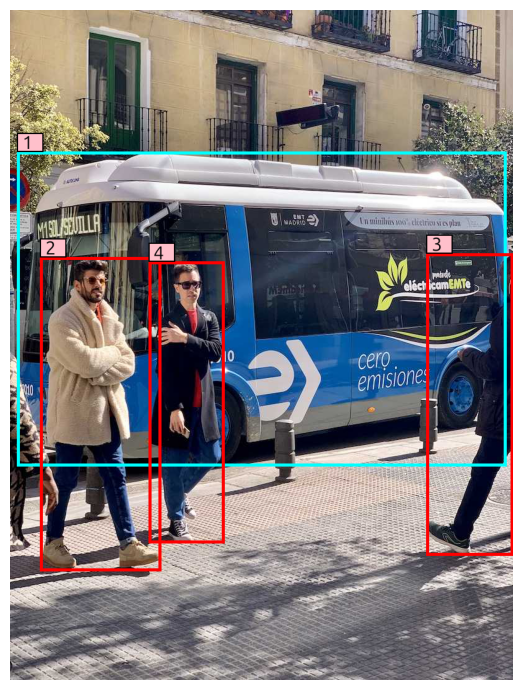

Recuadro 1: Clase=bus, Score=0.94, Caja=tensor([ 11.9472, 228.3151, 799.1895, 735.3087], device='cuda:0')
Recuadro 2: Clase=person, Score=0.90, Caja=tensor([ 48.6464, 398.2117, 243.0680, 904.5064], device='cuda:0')
Recuadro 3: Clase=person, Score=0.85, Caja=tensor([670.6041, 392.3168, 810.0000, 879.6082], device='cuda:0')
Recuadro 4: Clase=person, Score=0.84, Caja=tensor([223.0595, 405.5998, 345.2839, 859.7147], device='cuda:0')


In [6]:
for i,_ in enumerate(results):
    detections = results[i].boxes # Array con los hits
    filtered_detections = []  # Array vacío con solo los hits con más de 50%

    for j, (cls, score, box) in enumerate(zip(detections.cls, detections.conf, detections.xyxy)):
        if score > 0.5:  
            filtered_detections.append((j, cls, score, box)) # Añadir hits

    image = Image.open(image_paths[i]).convert("RGB")
    draw = ImageDraw.Draw(image)
    font = ImageFont.truetype("usr/share/fonts/truetype/ubuntu/Ubuntu-B.ttf", size=30)

    legend = []

    colors = ["red", "blue", "green", "orange", "purple", "cyan", "magenta", "yellow", "pink", "brown"]
    def get_color_for_class(cls_idx):
        return colors[cls_idx % len(colors)] 

    for idx, (i, cls, score, box) in enumerate(filtered_detections, start=1):
        class_name = model.names[int(cls)]
        color = get_color_for_class(int(cls))

        legend.append(f"Recuadro {idx}: Clase={class_name}, Score={score:.2f}, Caja={box}")
        
        # Dibujar las cajas con su número
        draw.rectangle([box[0], box[1], box[2], box[3]], outline=color, width=5)
        draw.rectangle([box[0], box[1]-30, box[0]+2 + 40, box[1]],fill="black")
        draw.rectangle([box[0]+2, box[1]-28, box[0] + 40, box[1]-2],fill="pink")
        draw.text((box[0]+8, box[1]-32), str(idx), fill="black",font=font)

    plt.figure(figsize=(13,7))
    plt.imshow(image)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    [print(i) for i in legend]

## EJERCICIO 3
YOLOv11 también sirve para segmentación, aplica segmentación a las dos imágenes con las que estamos trabajando

100%|██████████| 5.90M/5.90M [00:00<00:00, 26.3MB/s]



0: 640x640 11 persons, 8 bicycles, 3 cars, 1 backpack, 6.5ms
1: 640x640 4 persons, 1 bus, 6.5ms
Speed: 1.3ms preprocess, 6.5ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


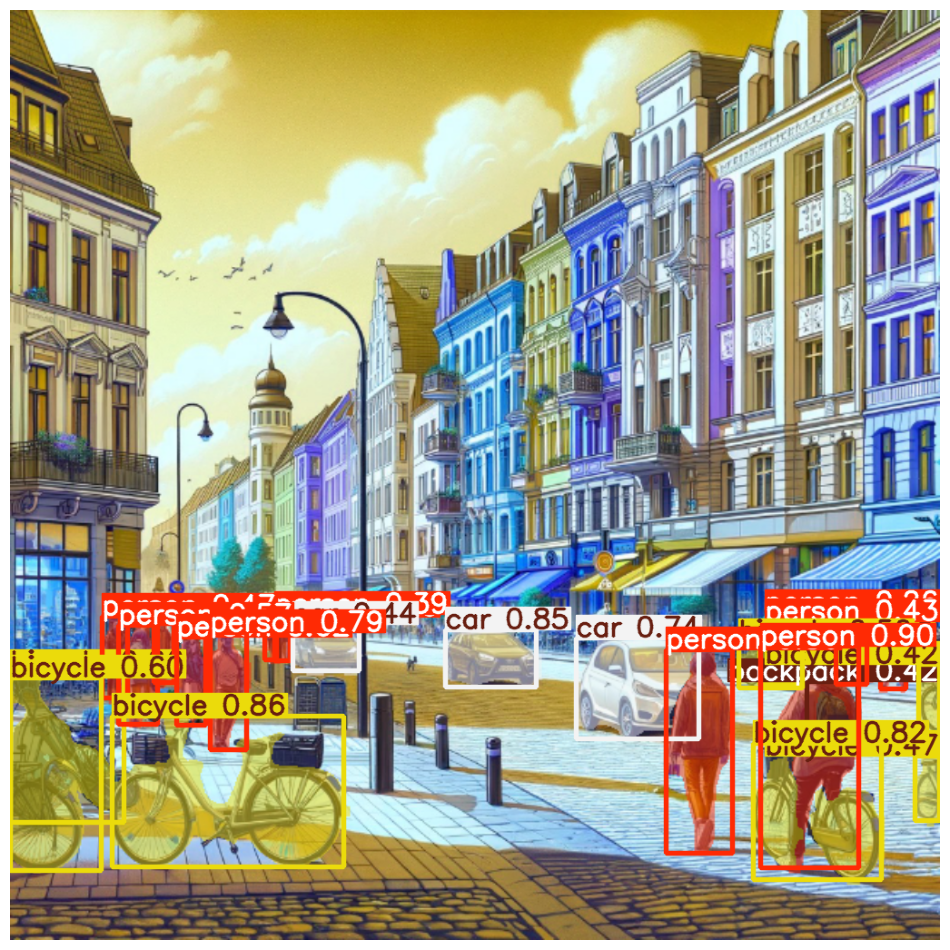

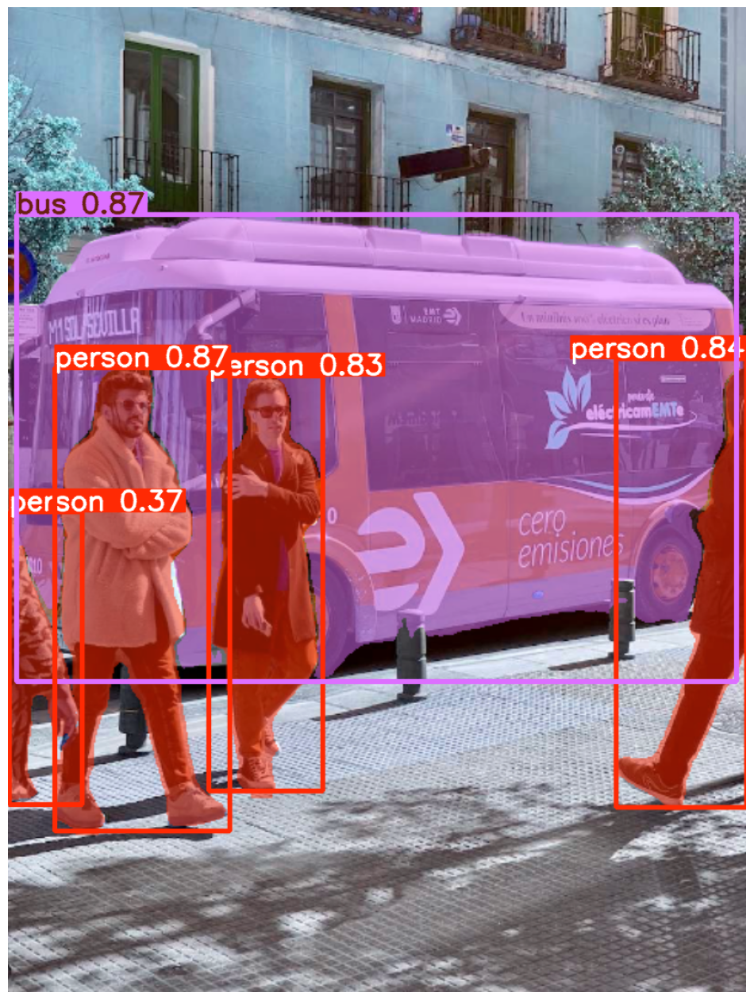

In [7]:
model = YOLO('Resultados/yolo11n-seg.pt') # Modelo que segmenta
image_paths = ["datos/deteccion_objetos.jpg", "datos/bus.jpg"]
results = model(image_paths)
for i,result in enumerate(results):
    image_with_boxes = results[i].plot()
    plt.figure(figsize=(12, 20)) 
    plt.imshow(image_with_boxes)
    plt.axis("off") 
    plt.show()

## EJERCICIO 4
De manera similar, podemos hacer la estimación de pose. Hazlo con las imágenes con las que estamos trabajando.

In [ ]:
model = YOLO('Resultados/yolo11n-pose.pt') # Modelo con estimador de pose
image_paths = ["datos/deteccion_objetos.jpg", "datos/bus.jpg"]
results = model(image_paths)
for i,result in enumerate(results):
    image_with_boxes = results[i].plot()
    plt.figure(figsize=(12, 20)) 
    plt.imshow(image_with_boxes)
    plt.axis("off") 
    plt.show()

## EJERCICIO 5
Haz lo que se hace en el siguiente video:

https://www.youtube.com/watch?v=_YbEna8UNcU

Tienes parte del código en:

https://www.albertcoronado.com/2024/11/12/tutorial-yolo-11/

Para la parte fine tuning tienes que entrenar el modelo para que distina matrículas de coche, para entrenar el modelo utiliza el dataset que puedes descargar de:

https://universe.roboflow.com/parag-parmar-3qpin/car_license_plate-ypwmk/dataset/1

NOTA: HE CONSEGUIDO QUE FUNCIONE BIEN CV2 PERO ABRIENDO PRIMERO UNA IMAGEN:
```
img = cv2.imread('Datos/image3.jpg')
cv2.imshow("SAPA", img)
cv2.waitKey(0)
cv2.destroyAllWindows()
```

In [1]:
!yolo predict model="Resultados/yolo11n.pt" source='datos/genteFeliz.jpg' project="Resultados/predicciones" conf=0.25 task=detect mode=predict save=True

/home/iabd/anaconda3/envs/entorno/lib/python3.9/site-packages/torch/utils/_pytree.py:185: FutureWarning: optree is installed but the version is too old to support PyTorch Dynamo in C++ pytree. C++ pytree support is disabled. Please consider upgrading optree using `python3 -m pip install --upgrade 'optree>=0.13.0'`.
  warnings.warn(
Ultralytics 8.3.70 🚀 Python-3.9.21 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
YOLO11n summary (fused): 238 layers, 2,616,248 parameters, 0 gradients, 6.5 GFLOPs

image 1/1 /home/iabd/VSCode/Python_clase/SAPA/Ejercicios/datos/genteFeliz.jpg: 448x640 8 persons, 1 kite, 1 tennis racket, 30.3ms
Speed: 3.1ms preprocess, 30.3ms inference, 93.7ms postprocess per image at shape (1, 3, 448, 640)
Results saved to Resultados/predicciones/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict



0: 448x640 8 persons, 1 kite, 1 tennis racket, 29.9ms
Speed: 4.2ms preprocess, 29.9ms inference, 73.9ms postprocess per image at shape (1, 3, 448, 640)


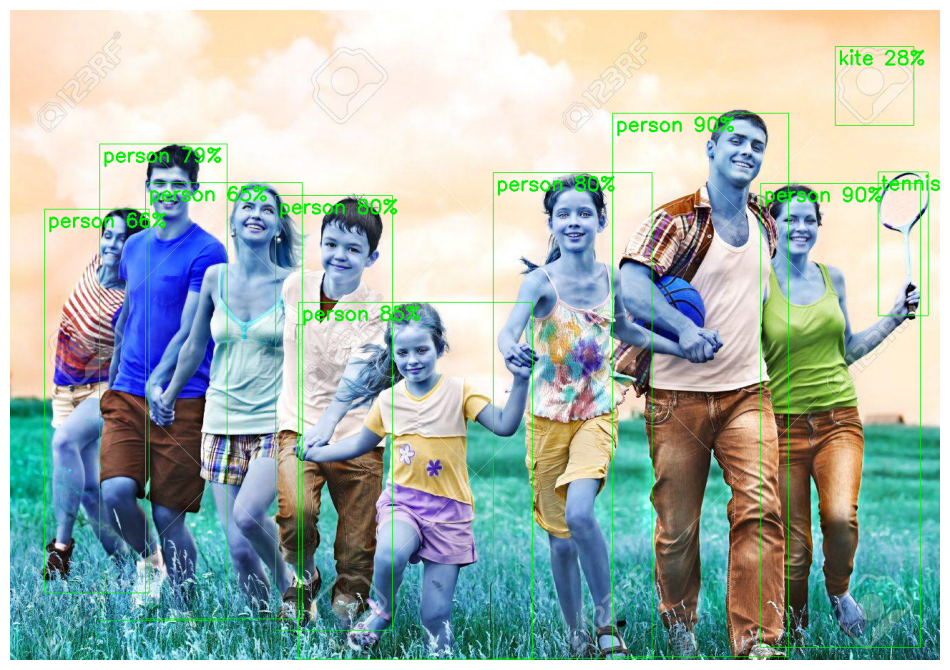

In [ ]:
model = YOLO("Resultados/yolo11n.pt")

font = cv2.FONT_HERSHEY_SIMPLEX
fontScale = 0.9
color = (0, 240, 0)
thickness = 2

img = cv2.imread('datos/genteFeliz.jpg') 
results = model(img)import cv2
import math
import ultralytics 

model = ultralytics.YOLO("yolo11x.pt")
cap = cv2.VideoCapture(0)

font = cv2.FONT_HERSHEY_SIMPLEX
fontScale = 0.7
color = (0, 250, 0)
thickness = 2

while True:
    success, img = cap.read()
    results = model( img, stream=True )

    for r in results:
        for box in r.boxes:
            x1, y1, x2, y2 = box.xyxy[0]
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)

            confidence = math.ceil((box.conf[0]*100))
            
            cv2.rectangle(img, ( x1, y1 ), ( x2, y2 ), color, 1)
            cv2.putText(img, r.names[ int( box.cls[0] ) ]+" "+str(confidence)+"%", [ x1+4, y1+25 ], font, fontScale, color, thickness)

    cv2.imshow('Webcam', img)

    if cv2.waitKey(1) == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

for r in results:
    for box in r.boxes:
        x1, y1, x2, y2 = box.xyxy[0]
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        confidence = math.ceil((box.conf[0]*100))
        cv2.rectangle(img, ( x1, y1 ), ( x2, y2 ), color, 1)
        cv2.putText(img, r.names[ int( box.cls[0] ) ]+" "+str(confidence)+"%", [ x1+4, y1+25 ], font, fontScale, color, thickness)

cv2.imwrite('Resultados/resultado.jpg', img)

plt.figure(figsize=(12, 20)) 
plt.imshow(img)
plt.axis("off") 
plt.show()

In [ ]:
import cv2
import math
import ultralytics 

model = ultralytics.YOLO("yolo11x.pt")
cap = cv2.VideoCapture(0)

font = cv2.FONT_HERSHEY_SIMPLEX
fontScale = 0.7
color = (0, 250, 0)
thickness = 2

while True:
    success, img = cap.read()
    results = model( img, stream=True )

    for r in results:
        for box in r.boxes:
            x1, y1, x2, y2 = box.xyxy[0]
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)

            confidence = math.ceil((box.conf[0]*100))
            
            cv2.rectangle(img, ( x1, y1 ), ( x2, y2 ), color, 1)
            cv2.putText(img, r.names[ int( box.cls[0] ) ]+" "+str(confidence)+"%", [ x1+4, y1+25 ], font, fontScale, color, thickness)

    cv2.imshow('Webcam', img)

    if cv2.waitKey(1) == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

In [5]:
!yolo task=detect mode=train epochs=50 batch=10 model='Resultados/yolo11s' data='/home/iabd/Descargas/car_plates/car_license_plate.v1i.yolov11/data.yaml' project="Resultados/predicciones"

/home/iabd/anaconda3/envs/entorno/lib/python3.9/site-packages/torch/utils/_pytree.py:185: FutureWarning: optree is installed but the version is too old to support PyTorch Dynamo in C++ pytree. C++ pytree support is disabled. Please consider upgrading optree using `python3 -m pip install --upgrade 'optree>=0.13.0'`.
  warnings.warn(
Ultralytics 8.3.70 🚀 Python-3.9.21 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
engine/trainer: task=detect, mode=train, model=Resultados/yolo11s, data=/home/iabd/Descargas/car_plates/car_license_plate.v1i.yolov11/data.yaml, epochs=50, time=None, patience=100, batch=10, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=Resultados/predicciones, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mas

In [6]:
!yolo predict model='/home/iabd/VSCode/Python_clase/SAPA/Ejercicios/Resultados/predicciones/train/weights/best.pt' source='datos/carTest.jpg' project="Resultados/predicciones" conf=0.35

/home/iabd/anaconda3/envs/entorno/lib/python3.9/site-packages/torch/utils/_pytree.py:185: FutureWarning: optree is installed but the version is too old to support PyTorch Dynamo in C++ pytree. C++ pytree support is disabled. Please consider upgrading optree using `python3 -m pip install --upgrade 'optree>=0.13.0'`.
  warnings.warn(
Ultralytics 8.3.70 🚀 Python-3.9.21 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
YOLO11s summary (fused): 238 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs

image 1/1 /home/iabd/VSCode/Python_clase/SAPA/Ejercicios/datos/carTest.jpg: 640x640 1 licence, 7.9ms
Speed: 5.1ms preprocess, 7.9ms inference, 104.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to Resultados/predicciones/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


## EJERCICIO 6
Repite el fine tuning del apartado anterior pero ahora en vez de como un comando en la terminal con código de python

Iniciando entrenamiento...
Ultralytics 8.3.70 🚀 Python-3.9.21 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
engine/trainer: task=detect, mode=train, model=Resultados/yolo11s.pt, data=/home/iabd/Descargas/car_plates/car_license_plate.v1i.yolov11/data.yaml, epochs=50, time=None, patience=100, batch=10, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=Resultados/predicciones, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=Non

train: Scanning /home/iabd/Descargas/car_plates/car_license_plate.v1i.yolov11/train/labels.cache... 210 images, 0 backgrounds, 0 corrupt: 100%|██████████| 210/210 [00:00<?, ?it/s]
val: Scanning /home/iabd/Descargas/car_plates/car_license_plate.v1i.yolov11/valid/labels.cache... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<?, ?it/s]


Plotting labels to Resultados/predicciones/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.00046875), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to Resultados/predicciones/train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.81G      1.823      7.528      1.595         22        640: 100%|██████████| 21/21 [00:02<00:00,  9.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.16it/s]

                   all         60         64      0.512      0.156      0.167     0.0905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50       2.8G      1.776      2.899      1.382         24        640: 100%|██████████| 21/21 [00:01<00:00, 11.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 11.50it/s]

                   all         60         64      0.315      0.375      0.187     0.0643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50       2.8G       1.81      2.166      1.517         15        640: 100%|██████████| 21/21 [00:01<00:00, 11.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 11.01it/s]

                   all         60         64      0.194      0.109     0.0587     0.0222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50       2.8G      1.814       1.92      1.472         16        640: 100%|██████████| 21/21 [00:01<00:00, 11.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.49it/s]

                   all         60         64    0.00063     0.0312   0.000262   7.53e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.82G      1.884      1.969      1.588         24        640: 100%|██████████| 21/21 [00:01<00:00, 11.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.71it/s]

                   all         60         64    0.00709      0.312    0.00373    0.00175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.81G      1.822      1.789       1.59         15        640: 100%|██████████| 21/21 [00:02<00:00,  9.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.54it/s]

                   all         60         64    0.00924      0.609    0.00719    0.00353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50       2.8G      1.782       1.62      1.533         24        640: 100%|██████████| 21/21 [00:02<00:00,  9.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.84it/s]

                   all         60         64    0.00372       0.75    0.00345    0.00169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50       2.8G      1.684      1.365      1.496         23        640: 100%|██████████| 21/21 [00:01<00:00, 11.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.49it/s]

                   all         60         64    0.00385      0.734    0.00348    0.00177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50       2.8G      1.748      1.346      1.489         24        640: 100%|██████████| 21/21 [00:02<00:00,  9.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.69it/s]

                   all         60         64      0.184      0.562      0.151     0.0643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50       2.8G      1.707       1.27      1.485         30        640: 100%|██████████| 21/21 [00:01<00:00, 10.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.17it/s]


                   all         60         64       0.56      0.562      0.495      0.243

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50       2.8G      1.642       1.31      1.428         21        640: 100%|██████████| 21/21 [00:02<00:00,  9.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.44it/s]

                   all         60         64      0.751      0.453      0.513      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.81G      1.569      1.197      1.397         23        640: 100%|██████████| 21/21 [00:02<00:00, 10.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.03it/s]


                   all         60         64      0.722      0.578      0.628      0.319

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50       2.8G      1.605      1.184      1.434         30        640: 100%|██████████| 21/21 [00:01<00:00, 11.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.79it/s]

                   all         60         64      0.788      0.547      0.616       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50       2.8G      1.609      1.168      1.409         18        640: 100%|██████████| 21/21 [00:01<00:00, 10.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.64it/s]


                   all         60         64      0.756      0.594      0.655      0.338

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50       2.8G      1.582       1.18      1.412         24        640: 100%|██████████| 21/21 [00:02<00:00, 10.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.47it/s]

                   all         60         64      0.722      0.608      0.683      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.81G      1.515      1.085      1.343         23        640: 100%|██████████| 21/21 [00:01<00:00, 10.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.30it/s]

                   all         60         64      0.717      0.531      0.616       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50       2.8G      1.524      1.086      1.398         16        640: 100%|██████████| 21/21 [00:02<00:00,  9.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.55it/s]

                   all         60         64       0.72      0.625      0.669      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50       2.8G      1.533      1.096      1.309         26        640: 100%|██████████| 21/21 [00:02<00:00, 10.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.12it/s]


                   all         60         64      0.665      0.682      0.666      0.312

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50       2.8G      1.474      1.076      1.318         16        640: 100%|██████████| 21/21 [00:02<00:00, 10.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.19it/s]

                   all         60         64      0.864      0.596      0.704      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50       2.8G      1.432     0.9988      1.284         18        640: 100%|██████████| 21/21 [00:01<00:00, 10.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.37it/s]

                   all         60         64      0.631      0.781      0.787      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50       2.8G      1.472      1.022      1.317         17        640: 100%|██████████| 21/21 [00:01<00:00, 11.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.75it/s]

                   all         60         64      0.657      0.625      0.701       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50       2.8G      1.413     0.9637      1.284         21        640: 100%|██████████| 21/21 [00:02<00:00, 10.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.13it/s]


                   all         60         64      0.735      0.578      0.628      0.361

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50       2.8G       1.46      1.052      1.324         16        640: 100%|██████████| 21/21 [00:02<00:00, 10.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.57it/s]

                   all         60         64      0.854      0.638      0.723      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50       2.8G      1.471     0.9731      1.312         24        640: 100%|██████████| 21/21 [00:01<00:00, 11.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.92it/s]


                   all         60         64      0.862      0.609       0.67      0.359

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50       2.8G      1.384     0.9406      1.301         21        640: 100%|██████████| 21/21 [00:02<00:00, 10.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.37it/s]

                   all         60         64      0.865      0.641      0.735      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.81G      1.467     0.9895      1.356         15        640: 100%|██████████| 21/21 [00:01<00:00, 11.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.77it/s]

                   all         60         64       0.75      0.672      0.777      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.79G       1.41     0.9657      1.299         31        640: 100%|██████████| 21/21 [00:02<00:00, 10.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.49it/s]

                   all         60         64       0.87      0.719      0.817      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50       2.8G      1.323     0.8914      1.239         22        640: 100%|██████████| 21/21 [00:01<00:00, 11.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.54it/s]

                   all         60         64      0.788      0.719      0.777      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50       2.8G      1.342      0.873      1.234         22        640: 100%|██████████| 21/21 [00:01<00:00, 10.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.39it/s]

                   all         60         64      0.772      0.688      0.715      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50       2.8G      1.361     0.9031       1.27         13        640: 100%|██████████| 21/21 [00:02<00:00,  9.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.78it/s]


                   all         60         64      0.812      0.766       0.81      0.389

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50       2.8G      1.321     0.8406      1.196         23        640: 100%|██████████| 21/21 [00:01<00:00, 11.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.44it/s]

                   all         60         64      0.772      0.797      0.816      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50       2.8G      1.266     0.8443      1.248         19        640: 100%|██████████| 21/21 [00:01<00:00, 10.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.14it/s]

                   all         60         64      0.826      0.766      0.806      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.81G      1.292     0.8552      1.234         24        640: 100%|██████████| 21/21 [00:02<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.48it/s]

                   all         60         64      0.768      0.766      0.768      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50       2.8G      1.255     0.8185      1.211         20        640: 100%|██████████| 21/21 [00:01<00:00, 10.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.69it/s]


                   all         60         64      0.801      0.757      0.791      0.422

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.81G      1.225     0.7902      1.208         28        640: 100%|██████████| 21/21 [00:01<00:00, 11.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.53it/s]

                   all         60         64      0.826      0.744      0.791       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50       2.8G      1.208     0.7883      1.192         28        640: 100%|██████████| 21/21 [00:02<00:00,  9.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.35it/s]

                   all         60         64      0.798       0.74      0.786      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50       2.8G      1.281     0.7856      1.214         29        640: 100%|██████████| 21/21 [00:01<00:00, 10.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.07it/s]


                   all         60         64      0.792      0.772      0.779      0.423

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50       2.8G       1.22     0.8199      1.229         25        640: 100%|██████████| 21/21 [00:02<00:00, 10.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.49it/s]

                   all         60         64      0.777      0.762       0.79      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50       2.8G      1.138     0.7258      1.131         26        640: 100%|██████████| 21/21 [00:01<00:00, 10.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.31it/s]

                   all         60         64      0.763      0.734      0.763      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50       2.8G      1.214     0.7831      1.196         14        640: 100%|██████████| 21/21 [00:02<00:00,  9.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.65it/s]

                   all         60         64      0.834      0.672      0.798      0.455


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50       2.8G      1.158     0.7078      1.137         11        640: 100%|██████████| 21/21 [00:02<00:00,  7.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.70it/s]


                   all         60         64      0.879      0.656      0.822      0.454

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50       2.8G      1.106     0.7109      1.147          9        640: 100%|██████████| 21/21 [00:01<00:00, 10.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.31it/s]

                   all         60         64      0.832      0.703      0.817      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50       2.8G      1.164      0.695      1.177         11        640: 100%|██████████| 21/21 [00:01<00:00, 11.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.30it/s]

                   all         60         64      0.794      0.785       0.84      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50       2.8G      1.071     0.6637      1.135         11        640: 100%|██████████| 21/21 [00:01<00:00, 10.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.07it/s]


                   all         60         64      0.772      0.766      0.811       0.47

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50       2.8G      1.151     0.6647      1.158         13        640: 100%|██████████| 21/21 [00:01<00:00, 11.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.47it/s]

                   all         60         64      0.763      0.812      0.829      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50       2.8G      1.121     0.6675      1.142         10        640: 100%|██████████| 21/21 [00:01<00:00, 10.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.45it/s]

                   all         60         64      0.748      0.837      0.841      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50       2.8G      1.072     0.6422      1.107         10        640: 100%|██████████| 21/21 [00:01<00:00, 11.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.62it/s]


                   all         60         64      0.824      0.766      0.833      0.465

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50       2.8G      1.028     0.6523      1.135         11        640: 100%|██████████| 21/21 [00:01<00:00, 11.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.72it/s]

                   all         60         64      0.825      0.738      0.822      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50       2.8G      1.045     0.6209      1.092         12        640: 100%|██████████| 21/21 [00:01<00:00, 11.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.39it/s]

                   all         60         64      0.871       0.75       0.84      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50       2.8G      0.993     0.6036      1.091         13        640: 100%|██████████| 21/21 [00:01<00:00, 11.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.30it/s]

                   all         60         64      0.844      0.763      0.837      0.474



50 epochs completed in 0.039 hours.
Optimizer stripped from Resultados/predicciones/train2/weights/last.pt, 19.2MB
Optimizer stripped from Resultados/predicciones/train2/weights/best.pt, 19.2MB

Validating Resultados/predicciones/train2/weights/best.pt...
Ultralytics 8.3.70 🚀 Python-3.9.21 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
YOLO11s summary (fused): 238 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 12.69it/s]


                   all         60         64      0.844      0.762      0.836      0.472
Speed: 0.2ms preprocess, 1.9ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to Resultados/predicciones/train2
Entrenamiento completado.
Iniciando predicción...

image 1/1 /home/iabd/VSCode/Python_clase/SAPA/Ejercicios/datos/carTest.jpg: 640x640 1 licence, 4.2ms
Speed: 1.2ms preprocess, 4.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)
Results saved to Resultados/predicciones/predict3
Predicción completada.
Resultados guardados en: Resultados/predicciones/predicted_image.jpg


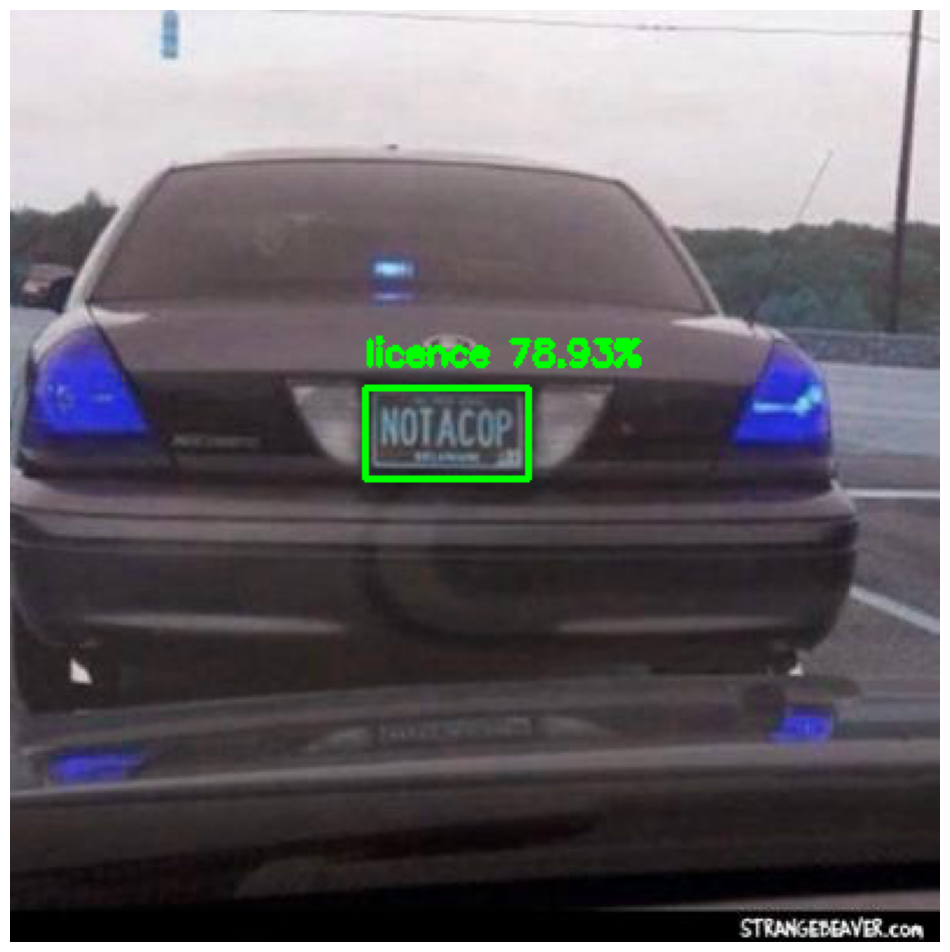

In [7]:
# Define rutas de entrada y salida
train_data = '/home/iabd/Descargas/car_plates/car_license_plate.v1i.yolov11/data.yaml'
train_model = 'Resultados/yolo11s'
train_project = 'Resultados/predicciones'

predict_model = 'Resultados/predicciones/train/weights/best.pt'
predict_source = 'datos/carTest.jpg'
predict_output = 'Resultados/predicciones'
conf_threshold = 0.35

# Entrenamiento
print("Iniciando entrenamiento...")
model = YOLO(train_model)  # Cargar modelo
model.train(
    data=train_data,
    epochs=50,
    batch=10,
    project=train_project
)
print("Entrenamiento completado.")

# Predicción
print("Iniciando predicción...")
model = YOLO(predict_model)  # Cargar modelo entrenado
results = model.predict(
    source=predict_source,
    project=predict_output,
    conf=conf_threshold,
    save=True
)
print("Predicción completada.")

# Mostrar resultados
for result in results:
    img = result.orig_img  # Imagen original
    for box in result.boxes:
        # Extraer coordenadas del cuadro delimitador
        x1, y1, x2, y2 = map(int, box.xyxy[0])  # Convertir a enteros
        label = f"{result.names[int(box.cls[0])]} {box.conf[0]*100:.2f}%"

        # Dibujar cuadros y etiquetas
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Mostrar imagen con predicciones
    cv2.imshow('Resultados', img)

    # Guardar resultados
    output_path = f"{predict_output}/predicted_image.jpg"
    cv2.imwrite(output_path, img)
    print(f"Resultados guardados en: {output_path}")

    plt.figure(figsize=(12, 20)) 
    plt.imshow(img)
    plt.axis("off") 
    plt.show()

    # Esperar para cerrar la ventana
    cv2.waitKey(0)
    cv2.destroyAllWindows()

## EJERCICIO 7
Vamos a contar los pasajeros de un autobus.

Sigue las instrucciones del siguiente video:

https://www.youtube.com/watch?v=hTI0Aj__SLE

ELIMINA LOS COMENTARIOS QUE HAY EN EL CÓDIGO Y COMENTA EL CÓDIGO CON TUS PROPIAS PALABRAS


In [8]:
from ultralytics.solutions.solutions import BaseSolution
from ultralytics.utils.plotting import Annotator, colors
import csv
from datetime import datetime
import os


class ObjectCounter(BaseSolution):
    """
    A class to manage the counting of objects in a real-time video stream based on their tracks.

    This class extends the BaseSolution class and provides functionality for counting objects moving in and out of a
    specified region in a video stream. It supports both polygonal and linear regions for counting.

    Attributes:
        in_count (int): Counter for objects moving inward.
        out_count (int): Counter for objects moving outward.
        counted_ids (List[int]): List of IDs of objects that have been counted.
        saved_ids (List[int]): List of IDs of objects that have been saved to the CSV file.
        classwise_counts (Dict[str, Dict[str, int]]): Dictionary for counts, categorized by object class.
        region_initialized (bool): Flag indicating whether the counting region has been initialized.
        show_in (bool): Flag to control display of inward count.
        show_out (bool): Flag to control display of outward count.
    """

    def __init__(self, **kwargs):
        """Initializes the ObjectCounter class for real-time object counting in video streams."""
        super().__init__(**kwargs)

        self.in_count = 0  # Contador para objetos que se acercan
        self.out_count = 0  # Contador para objetos que se alejan
        self.counted_ids = []  # Lista para IDs de los objetos ya contados
        self.saved_ids = []  # Lista de IDs ya guardados en el csv
        self.classwise_counts = {}  # Diccionario de conteo, categorizado
        self.region_initialized = False  # Booleno para inicialización de región

        self.show_in = self.CFG.get("show_in", True)
        self.show_out = self.CFG.get("show_out", True)

    def save_label_to_csv(self, track_id, label, action):
        """Save the label, track_id, action, and current time to a new CSV file with the current date."""
        if track_id in self.saved_ids:
            return  # Ignora guardar el ID si ya está en la lista

        current_time = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
        current_date = datetime.now().strftime("%Y-%m-%d")  # Fecha actual en el formato correcto

        # Crea nombre del fichero con la fecha actual
        filename = f'tracked_objects_{current_date}.csv'

        # Comprueba que exista el fichero, si existe escribe otro nombre
        file_exists = os.path.isfile(filename)

        with open(filename, mode='a', newline='') as file:
            writer = csv.writer(file)

            # Si no existe el fichero escribe headers
            if not file_exists:
                writer.writerow(['track_id', 'label', 'action', 'date', 'time'])

            # Escribe en la columna de datos con el ID actual
            writer.writerow([track_id, label, action, current_time.split()[0], current_time.split()[1]])
            self.saved_ids.append(track_id)  # Marca el ID como guardado

    def count_objects(self, current_centroid, track_id, prev_position, cls):
        """
        Counts objects within a polygonal or linear region based on their tracks.

        Args:
            current_centroid (Tuple[float, float]): Current centroid values in the current frame.
            track_id (int): Unique identifier for the tracked object.
            prev_position (Tuple[float, float]): Last frame position coordinates (x, y) of the track.
            cls (int): Class index for classwise count updates.
        """
        if prev_position is None or track_id in self.counted_ids:
            return

        action = None  # Por defecto es None

        if len(self.region) == 2:  # Region lineal
            line = self.LineString(self.region)
            if line.intersects(self.LineString([prev_position, current_centroid])):
                if abs(self.region[0][0] - self.region[1][0]) < abs(self.region[0][1] - self.region[1][1]):
                    if current_centroid[0] > prev_position[0]:  # Movimiento derecha
                        self.in_count += 1
                        self.classwise_counts[self.names[cls]]["IN"] += 1
                        action = "IN"
                    else:  # Movimiento izquierda
                        self.out_count += 1
                        self.classwise_counts[self.names[cls]]["OUT"] += 1
                        action = "OUT"
                else:
                    if current_centroid[1] > prev_position[1]:  # Movimiento abajo
                        self.in_count += 1
                        self.classwise_counts[self.names[cls]]["IN"] += 1
                        action = "IN"
                    else:  # Movimiento arriba
                        self.out_count += 1
                        self.classwise_counts[self.names[cls]]["OUT"] += 1
                        action = "OUT"
                self.counted_ids.append(track_id)

        elif len(self.region) > 2:  # Region poligonal
            polygon = self.Polygon(self.region)
            if polygon.contains(self.Point(current_centroid)):
                region_width = max([p[0] for p in self.region]) - min([p[0] for p in self.region])
                region_height = max([p[1] for p in self.region]) - min([p[1] for p in self.region])

                if region_width < region_height:
                    if current_centroid[0] > prev_position[0]:  # Movimiento derecha
                        self.in_count += 1
                        self.classwise_counts[self.names[cls]]["IN"] += 1
                        action = "IN"
                    else:  # Movimiento izquierda
                        self.out_count += 1
                        self.classwise_counts[self.names[cls]]["OUT"] += 1
                        action = "OUT"
                else:
                    if current_centroid[1] > prev_position[1]:  # Movimiento abajo
                        self.in_count += 1
                        self.classwise_counts[self.names[cls]]["IN"] += 1
                        action = "IN"
                    else:  # Movimiento arriba
                        self.out_count += 1
                        self.classwise_counts[self.names[cls]]["OUT"] += 1
                        action = "OUT"
                self.counted_ids.append(track_id)

        # Guarda la etiqueta y la acción
        if action:
            label = f"{self.names[cls]} ID: {track_id}"
            self.save_label_to_csv(track_id, label, action)

    def store_classwise_counts(self, cls):
        """Initialize class-wise counts for a specific object class if not already present."""
        if self.names[cls] not in self.classwise_counts:
            self.classwise_counts[self.names[cls]] = {"IN": 0, "OUT": 0}

    def display_counts(self, im0):
        """Displays object counts on the input image or frame."""
        labels_dict = {
            str.capitalize(key): f"{'IN ' + str(value['IN']) if self.show_in else ''} "
            f"{'OUT ' + str(value['OUT']) if self.show_out else ''}".strip()
            for key, value in self.classwise_counts.items()
            if value["IN"] != 0 or value["OUT"] != 0
        }

        if labels_dict:
            self.annotator.display_analytics(im0, labels_dict, (104, 31, 17), (255, 255, 255), 10)

        for track_id in self.track_ids:
            if track_id in self.counted_ids:
                in_count = self.in_count
                label = f"ID:{track_id} count at number {in_count}"
                self.annotator.box_label(self.boxes[self.track_ids.index(track_id)], label=label, color=(255, 255, 0))

    def count(self, im0):
        """Processes input data (frames or object tracks) and updates object counts."""
        if not self.region_initialized:
            self.initialize_region()
            self.region_initialized = True

        self.annotator = Annotator(im0, line_width=self.line_width)
        self.extract_tracks(im0)
        self.annotator.draw_region(reg_pts=self.region, color=(104, 0, 123), thickness=self.line_width * 2)

        for box, track_id, cls in zip(self.boxes, self.track_ids, self.clss):
            self.store_tracking_history(track_id, box)
            self.store_classwise_counts(cls)

            label = f"{self.names[cls]} ID: {track_id}"
            self.annotator.box_label(box, label=label, color=colors(cls, True))

            current_centroid = ((box[0] + box[2]) / 2, (box[1] + box[3]) / 2)
            prev_position = self.track_history[track_id][-2] if len(self.track_history[track_id]) > 1 else None
            self.count_objects(current_centroid, track_id, prev_position, cls)

        self.display_counts(im0)
        self.display_output(im0)

        return im0

In [13]:
import cv2

# Función para el tracking del ratón
def RGB(event, x, y, flags, param):
    if event == cv2.EVENT_MOUSEMOVE:  # Comprueba que se mueva el ratón
        point = [x, y]
        print(f"Mouse moved to: {point}")

# Abrir el video
cap = cv2.VideoCapture('datos/1.mp4')

# Define región para contar
region_points = [(386,103), (458, 499)]

# Inicializa el contador
counter = ObjectCounter(
    region=region_points,  # Pasar los puntos de la región
    model="Resultados/yolo11s.pt",  # Modelo que cuente objetos
    classes=[0],  # Fijar la detección de clases a personas
    show_in=True,  # Enseñar contador de entradas
    show_out=True,  # Enseñar contador de salidas
    line_width=2,  # Adjustar ancho de linea para el output
)

# Crear una ventana con nombre y activar detección de ratón
cv2.namedWindow('RGB')
cv2.setMouseCallback('RGB', RGB)

count = 0

while True:
    # Leer fotograma del video
    ret, frame = cap.read()
    if not ret:
        break
        # Si el video se acaba, comenzar desde el principio
#        cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
#        continue
    count += 1
    if count % 2 != 0:  # Saltar fotogramas impares
        continue

    frame = cv2.resize(frame, (1020, 500))

    # Procesar el fotograma con el contador de objetos
    frame = counter.count(frame)

    # Enseñar el fotograma
    cv2.imshow("RGB", frame)
    if cv2.waitKey(1) & 0xFF == ord("q"):  # Pulsar q para salir
        break

# Liberar el capturador de video y cerrar la ventana
cap.release()
cv2.destroyAllWindows()

Ultralytics Solutions: ✅ {'region': [(386, 103), (458, 499)], 'show_in': True, 'show_out': True, 'colormap': None, 'up_angle': 145.0, 'down_angle': 90, 'kpts': [6, 8, 10], 'analytics_type': 'line', 'json_file': None, 'records': 5, 'model': 'yolo11s.pt', 'classes': [0], 'line_width': 2}

0: 320x640 6 persons, 5.5ms
Speed: 1.0ms preprocess, 5.5ms inference, 2.3ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 5 persons, 5.6ms
Speed: 1.1ms preprocess, 5.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 4 persons, 8.9ms
Speed: 1.7ms preprocess, 8.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 4 persons, 5.6ms
Speed: 1.1ms preprocess, 5.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 4 persons, 5.0ms
Speed: 1.1ms preprocess, 5.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 5 persons, 5.6ms
Speed: 1.0ms preprocess, 5.6ms inference, 1.0ms postprocess

## EJERCICIO 8
Adapta el código anterior para que cuente vehículos en el video vehicle-counting.mp4 (tiene que contar por separado coches y camiones)

In [18]:
import cv2

# Cargar el video
cap = cv2.VideoCapture('datos/vehicle-counting.mp4')

# Obtener ancho y alto del video
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

print(f"Dimensiones del video: {width}x{height}")

# Liberar el video
cap.release()

Dimensiones del video: 3840x2160


In [24]:
import cv2

# Función para el tracking del ratón
def RGB(event, x, y, flags, param):
    if event == cv2.EVENT_MOUSEMOVE:  # Comprueba que se mueva el ratón
        point = [x, y]
        print(f"Mouse moved to: {point}")

# Abrir el video
cap = cv2.VideoCapture('datos/vehicle-counting.mp4')

# Define región para contar
region_points = [(0, 255), (1019, 255)] # La mitad del video a ojo

# Inicializa el contador
counter = ObjectCounter(
    region=region_points,  # Pasar los puntos de la región
    model="yolo11s.pt",  # Modelo que cuente objetos
    classes=[2,7],  # Fijar la detección de clases a coches (2) y camiones (7)
    show_in=True,  # Enseñar contador de entradas
    show_out=True,  # Enseñar contador de salidas
    line_width=2,  # Adjustar ancho de linea para el output
)

# Crear una ventana con nombre y activar detección de ratón
cv2.namedWindow('RGB')
cv2.setMouseCallback('RGB', RGB)

count = 0

while True:
    # Leer fotograma del video
    ret, frame = cap.read()
    if not ret:
        break
        # Si el video se acaba, comenzar desde el principio
#        cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
#        continue
    count += 1
    if count % 2 != 0:  # Saltar fotogramas impares
        continue

    frame = cv2.resize(frame, (1020, 500))

    # Procesar el fotograma con el contador de objetos
    frame = counter.count(frame)

    # Enseñar el fotograma
    cv2.imshow("RGB", frame)
    if cv2.waitKey(1) & 0xFF == ord("q"):  # Pulsar q para salir
        break

# Liberar el capturador de video y cerrar la ventana
cap.release()
cv2.destroyAllWindows()

Ultralytics Solutions: ✅ {'region': [(0, 255), (1019, 255)], 'show_in': True, 'show_out': True, 'colormap': None, 'up_angle': 145.0, 'down_angle': 90, 'kpts': [6, 8, 10], 'analytics_type': 'line', 'json_file': None, 'records': 5, 'model': 'yolo11s.pt', 'classes': [2, 7], 'line_width': 2}

0: 320x640 4 cars, 1 truck, 5.0ms
Speed: 1.0ms preprocess, 5.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 4 cars, 1 truck, 5.9ms
Speed: 1.2ms preprocess, 5.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 4 cars, 1 truck, 5.2ms
Speed: 1.0ms preprocess, 5.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 4 cars, 1 truck, 5.4ms
Speed: 1.1ms preprocess, 5.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 5 cars, 1 truck, 5.4ms
Speed: 1.1ms preprocess, 5.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 5 cars, 1 truck, 5.2ms
Speed: 1.1ms preproce

## EJERCICIO 9
Adapta el ejercicio anterior para que en vez de coches cuente matrículas usando el modelo que has creado en el ejercicio 6. 

Si el video del apartado anterior no te sirve porque no se ven bien las matrículas crea un video con la IA generativa (si el video creado es demasiado corto junta varios videos en uno)

In [28]:
import cv2

# Función para el tracking del ratón
def RGB(event, x, y, flags, param):
    if event == cv2.EVENT_MOUSEMOVE:  # Comprueba que se mueva el ratón
        point = [x, y]
        print(f"Mouse moved to: {point}")

# Abrir el video
cap = cv2.VideoCapture('datos/Traffic.mp4')

# Define región para contar
region_points = [(0, 255), (1019, 255)] # La mitad del video a ojo

# Inicializa el contador
counter = ObjectCounter(
    region=region_points,  # Pasar los puntos de la región
    model="/home/iabd/VSCode/Python_clase/SAPA/Ejercicios/Resultados/predicciones/train/weights/best.pt",  # Modelo matriculas
    classes=[0],  # Fijar la detección de clases a primer item
    show_in=True,  # Enseñar contador de entradas
    show_out=True,  # Enseñar contador de salidas
    line_width=2,  # Adjustar ancho de linea para el output
)

# Crear una ventana con nombre y activar detección de ratón
cv2.namedWindow('RGB')
cv2.setMouseCallback('RGB', RGB)

count = 0

while True:
    # Leer fotograma del video
    ret, frame = cap.read()
    if not ret:
        break
        # Si el video se acaba, comenzar desde el principio
#        cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
#        continue
    #count += 1
    #if count % 2 != 0:  # Saltar fotogramas impares
        #continue

    frame = cv2.resize(frame, (1020, 500))

    # Procesar el fotograma con el contador de objetos
    frame = counter.count(frame)

    # Enseñar el fotograma
    cv2.imshow("RGB", frame)
    if cv2.waitKey(1) & 0xFF == ord("q"):  # Pulsar q para salir
        break

# Liberar el capturador de video y cerrar la ventana
cap.release()
cv2.destroyAllWindows()

Ultralytics Solutions: ✅ {'region': [(0, 255), (1019, 255)], 'show_in': True, 'show_out': True, 'colormap': None, 'up_angle': 145.0, 'down_angle': 90, 'kpts': [6, 8, 10], 'analytics_type': 'line', 'json_file': None, 'records': 5, 'model': '/home/iabd/VSCode/Python_clase/SAPA/Ejercicios/Resultados/predicciones/train/weights/best.pt', 'classes': [0], 'line_width': 2}

0: 320x640 1 licence, 5.7ms
Speed: 3.1ms preprocess, 5.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 1 licence, 7.8ms
Speed: 1.9ms preprocess, 7.8ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 640)
Mouse moved to: [506, 171]
Mouse moved to: [536, 201]

0: 320x640 1 licence, 5.7ms
Speed: 1.2ms preprocess, 5.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 640)
Mouse moved to: [541, 209]

0: 320x640 1 licence, 5.3ms
Speed: 1.2ms preprocess, 5.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 640)
Mouse moved to: [541, 211]

0: 320x640 1 licence, 4

## EJERCICIO 10
Vamos a hacer fine tuning sobre el modelo para segmentación SAM-2.

Puedes sacar información de la siguiente página:

https://blog.roboflow.com/fine-tune-sam-2-1/

A la hora de conseguir el dataset, descargalo para no tener problemas con la API-KEY de Roboflow

## EJERCICIO 11 (OPCIONAL)
Haz fine tuning con sam2 o yolo11 para segmentación con otro dataset 

## EJERCICIO 12 (OPCIONAL)
En el siguiente enlace encontraras diferentes modelos y trabajos sobre la visión por computación, prueba alguno de ellos (algunos que no funcionan porque las librerías se han actualizado y tienes que adaptarlos, otros son recientes y no deberías tener problemas).

https://github.com/roboflow/notebooks

ELIMINA LOS COMENTARIOS QUE HAY EN EL CÓDIGO Y COMENTA EL CÓDIGO CON TUS PROPIAS PALABRAS